In [1]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px

In [2]:
# reading tour dataframes
df = pd.read_csv(r'..\EDA\clean_df.csv')

In [3]:
# drop the Unnamed: 0 column
df.drop('Unnamed: 0', axis=1, inplace=True)

In [4]:
# show randomly 15 rows
df.sample(n = 15)

,Tour,Type,Duration,Price,Price Per,Cancellation,Tour By,City,Country,Image,Link to agency
752,Tianjin Shore Excursion: Mutianyu Great Wall T...,Full-day Tours,10.5,188.00,per adult,Free cancellation,By Beijing Tour Guide,Beijing,China,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
1487,PRIVATE TOURS IN BUENOS AIRES - CITYTOUR with ...,Bus Tours,3.0,40.00,per group,Free cancellation,By Argentina Elite Transfers and Tours. Amazin...,Buenos Aires,Argentina,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
10776,Dubai: Desert Safari with Camel Ride & Dune Ba...,Shore Excursions,6.0,34.00,per adult,Free cancellation,By Ganzay,Dubai,United Arab Emirates,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
4857,Day trip to atlas Mountains And 3 Valley & Ber...,Bus Tours,1.0,41.86,per adult,Free cancellation,By Tours from Marrakech,Marrakech,Morocco,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
8847,Half-Day Bike Tour in Seoul with Food Tasting,Private and Luxury,3.0,80.00,per adult,Free cancellation,By We Ride Korea,Seoul,South Korea,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
5598,Nizwa full day (Travel),Full-day Tours,7.5,200.00,per adult,Free cancellation,By Oman Day Tours,Muscat,Oman,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
6469,Private Full-Day Sightseeing Tour in Rio de Ja...,Full-day Tours,8.0,169.22,per group,Free cancellation,By Alessandro Sargentelli,Rio de Janeiro,Brazil,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
4236,Small Group Royal Walking Tour including Chang...,City Tours,1.5,26.30,per adult,Free cancellation,By Fun London Tours,London,UK,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
8903,Private Catamaran Yacht Tour in Han River,City Tours,1.0,363.47,per group,Free cancellation,By Seoul Marina Club & Yacht,Seoul,South Korea,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...
9445,Half Day Sightseeing Tour in The Hague and vis...,Bus Tours,5.0,223.60,per adult,Free cancellation,By VIP Travel Services,Amsterdam,Netherlands,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...


### *Assumptions:*

Only by looking into the sample data above. I can assume that:
- The **Bus Tours** are the most popular tour type in this data followed by **Walking Tours**
- The popular average tour duration is **3-6 hours**
- The tour price **per adult** is more than price per group in the data but it doesn't mean it higher than per group.
- The tour **price** will varies from one city to another based on the tour type and the duration. 

### *Questions:*
In this section I will answer analytical questions related to the data.
<br>

##### 1. How long most tours are? What is the average tour price for that?

In [5]:
# find the median of the Duration
median_Duration = df['Duration'].median()
print('The median duration for the tours in this dataset is', median_Duration ,'hours long')

The median duration for the tours in this dataset is 4.0 hours long


In [6]:
# split the Duration in the dataset into two lists less than the median and greater than the median (4 hours long)
short = df.query('Duration < {}'.format(median_Duration))
long = df.query('Duration >= {}'.format(median_Duration))

# split the average Price based on the long of duration
short_price = short['Price'].mean()
long_price = long['Price'].mean()

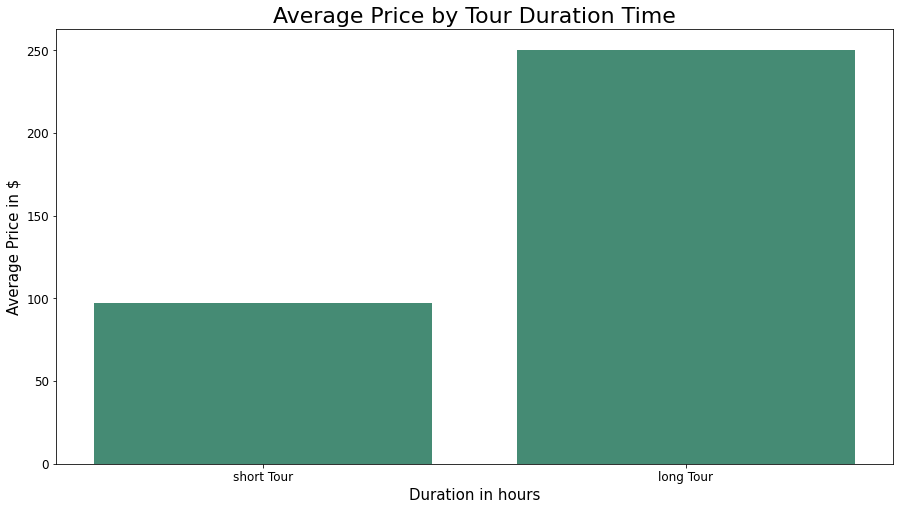

In [7]:
# bar plot to find the average price for each type of tour duration (short & long)
locations = [1, 2]
heights = [short_price, long_price]
labels = ['short Tour', 'long Tour']
plt.figure(figsize=(15,8))
plt.bar(locations, heights, tick_label=labels,color=['#458B74'])
plt.title('Average Price by Tour Duration Time',fontsize=22, color ='#000000')
plt.xticks( color ='#000000',fontsize=12)
plt.yticks(color ='#000000',fontsize=12)
plt.xlabel('Duration in hours',fontsize=15, color ='#000000')
plt.ylabel('Average Price in $',fontsize=15, color ='#000000');

In the beginning, I assumed that the popular tour duration time is in the range of 3-6 hours, based on the random sample of the dataset. After finding the median duration time of the tours which is 4 hours long, the above chart confirms my assumption. 
<br><br> 
The Majority of the tours in this dataset are >= 4 hours long, and the average tour price for the long tours is approximately $250. <br> Whereas the average tour price for all the short tours is less than $100. 


##### 2. How does the tour duration affect the tour price?

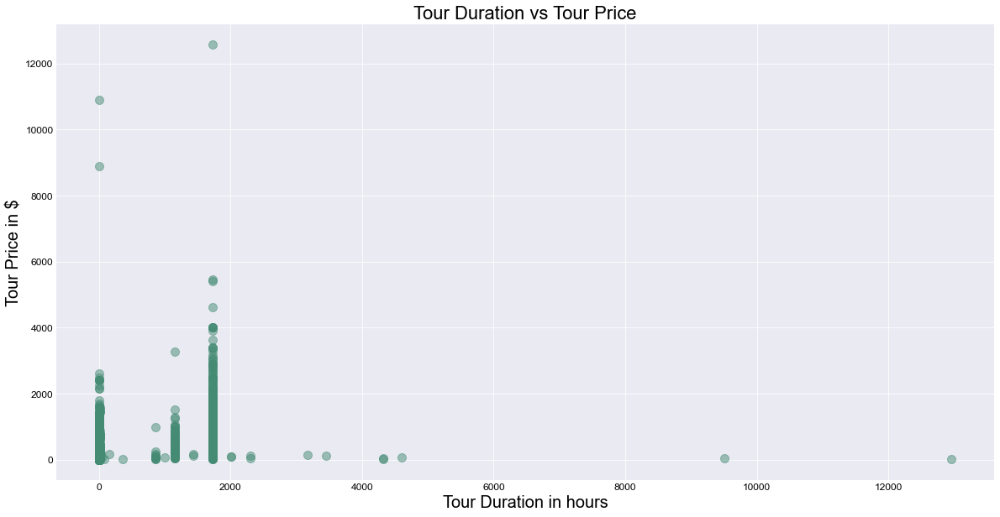

In [8]:
# scatter plot to show the relationship between the duration & price
x = df['Duration']
y = df['Price']
plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(20,10))
plt.scatter(x, y, c='#458B74', s=100, alpha=0.5)
plt.xticks( color ='#000000',fontsize=12)
plt.yticks(color ='#000000',fontsize=12)
plt.xlabel('Tour Duration in hours',fontsize=20, color ='#000000')
plt.ylabel('Tour Price in $',fontsize=20, color ='#000000')
plt.title('Tour Duration vs Tour Price',fontsize=22, color ='#000000');

In the above plot, we can not determine a direct relationship between the tour duration and price. The price varies even though the tours have the same duration time. Other features can affect the price are: if the price was per adult or per group, the city or the country in general & the tour type. That what leads me to the next comparison.

##### 3. Compare the tours average price of different countries.
*3.1 Regardless the other features* 

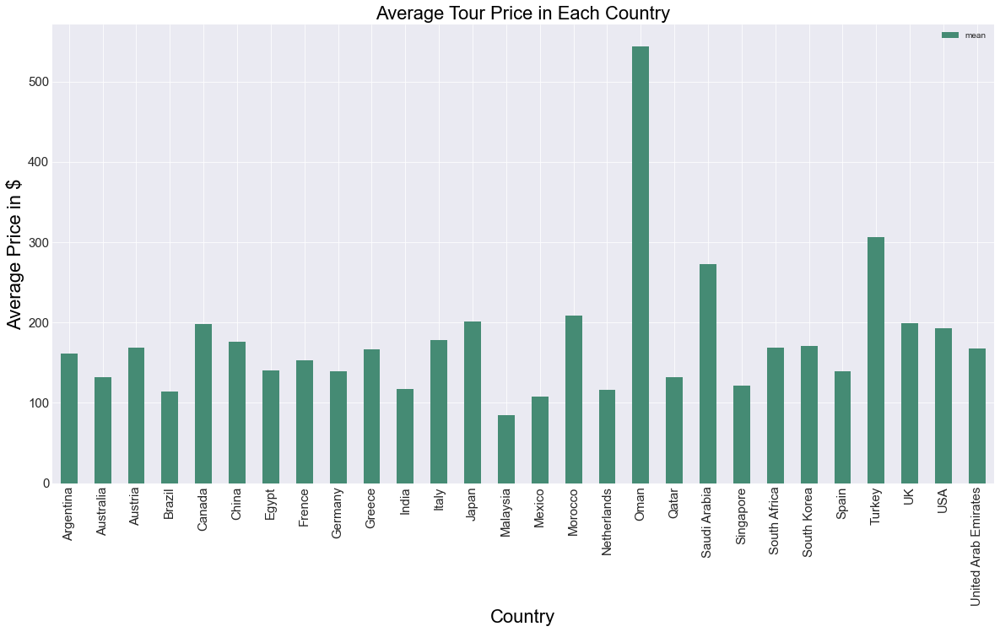

In [9]:
# group the average price by the country column regardless other fetures
groups = df.groupby(['Country']).Price.agg(['mean'])
groups.plot.bar(figsize=(20,10), color=('#458B74'))
plt.title('Average Tour Price in Each Country',fontsize=22, color ='#000000')
plt.xlabel('Country',fontsize=22, color ='#000000')
plt.ylabel('Average Price in $',fontsize=22, color ='#000000')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()

In [10]:
# check the maximum price if the country == Oman 
df.loc[df['Country']== 'Oman']['Price'].max()

5452.47

In [11]:
# check why Oman has the highest average
df.loc[df['Price']==5452.47]

,Tour,Type,Duration,Price,Price Per,Cancellation,Tour By,City,Country,Image,Link to agency
5590,Camping Tour 14 Days Package (Oman North & South),Adventure Tours,1728.0,5452.47,per adult,Free cancellation,By Discover Mazoon Tours Oman,Muscat,Oman,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...


In the above bar plot, Oman has the highest average tour price, back to the summary statistics of the price per country we can see that the minimum tour price in Oman is $30. Whereas in the other countries (except Qatar) the minimum tour price is in this range ($3.35-$11.44)  <br>
So, regardless other features, Oman followed by Turkey then Saudi Arabia are the countries with the highest tours average price.

*3.2 Regarding the price per (adult/group)* 

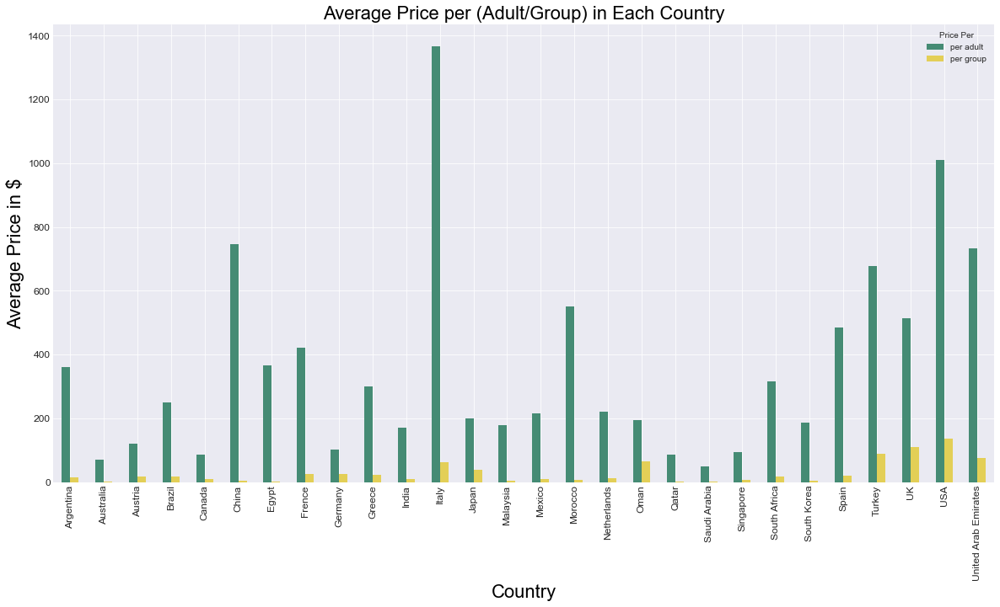

In [12]:
# groupby the Price per adult/group 
pd.crosstab(df['Country'],df['Price Per']).plot.bar(figsize=(20,10), color=('#458B74','#E3CF57'))

plt.title('Average Price per (Adult/Group) in Each Country',fontsize=22, color ='#000000')
plt.xlabel('Country',fontsize=22, color ='#000000')
plt.ylabel('Average Price in $',fontsize=22, color ='#000000')
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.show()

Italy has the highest average tour price per adult overall the other countries followed by United States then China.

##### 4. Compare distribution of tour price for different cities (can be reproducible)

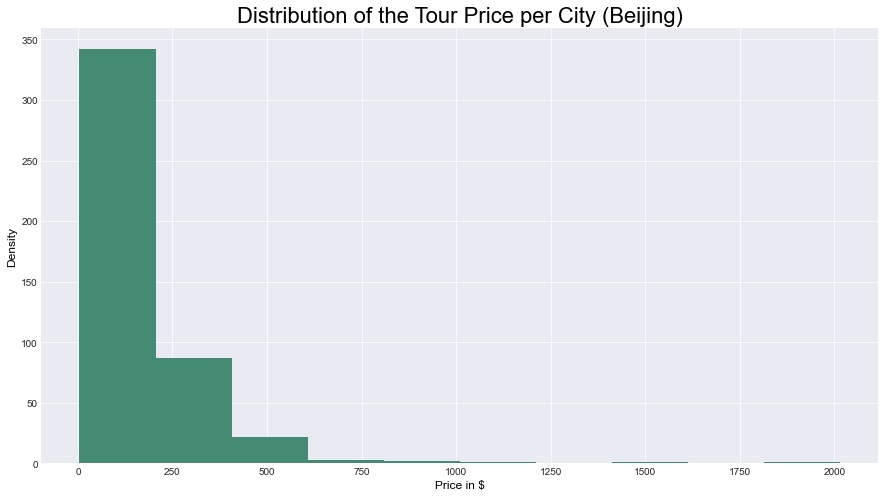

In [13]:
# histogram to show the distribution of the price for a specific city (Change the name of the city)
city = df[df['City'] == 'Beijing']
city['Price'].hist(figsize=(15,8), color= ('#458B74'))
plt.xlabel('Price in $',fontsize=12, color ='#000000')
plt.ylabel('Density',fontsize=12, color ='#000000')
plt.title('Distribution of the Tour Price per City (Beijing)',fontsize=22, color ='#000000');

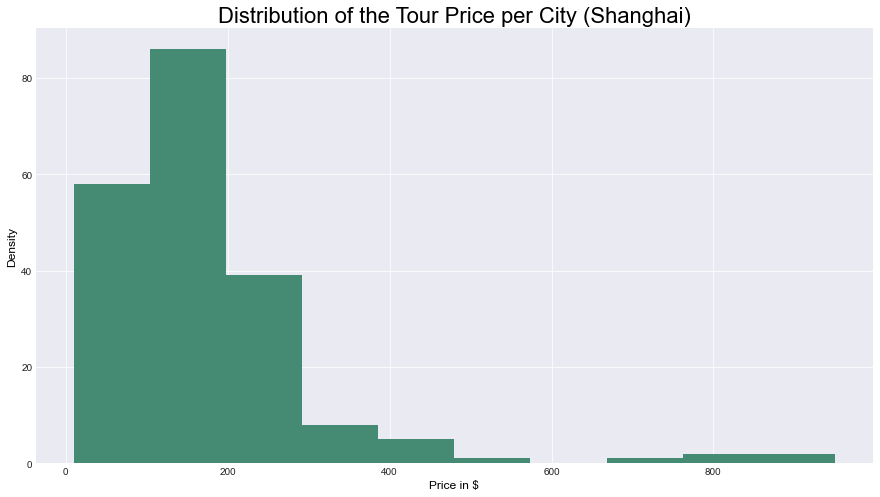

In [14]:
# histogram to show the distribution of the price for a specific city (Change the name of the city)
city = df[df['City'] == 'Shanghai']
city['Price'].hist(figsize=(15,8),color= ('#458B74'))
plt.xlabel('Price in $',fontsize=12, color ='#000000')
plt.ylabel('Density',fontsize=12, color ='#000000')
plt.title('Distribution of the Tour Price per City (Shanghai)',fontsize=22, color ='#000000');

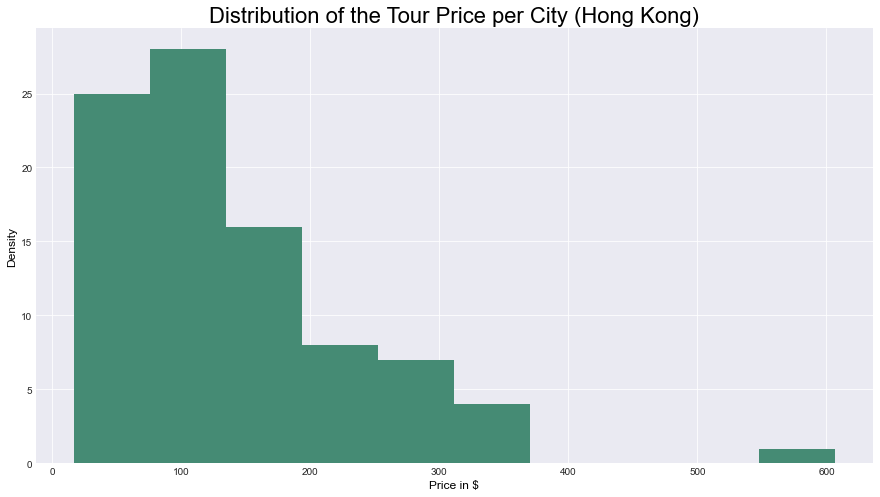

In [15]:
# histogram to show the distribution of the price for a specific city (Change the name of the city)
city = df[df['City'] == 'Hong Kong']
city['Price'].hist(figsize=(15,8), color= ('#458B74'))
plt.xlabel('Price in $',fontsize=12, color ='#000000')
plt.ylabel('Density',fontsize=12, color ='#000000')
plt.title('Distribution of the Tour Price per City (Hong Kong)',fontsize=22, color ='#000000');

As we can see from the above three histograms, the distribution of the tour price varies even though it the same country (China) but with different cities (Beijing, Shanghai & Hong Kong)

##### 5. How does the tour type affect the tour price?

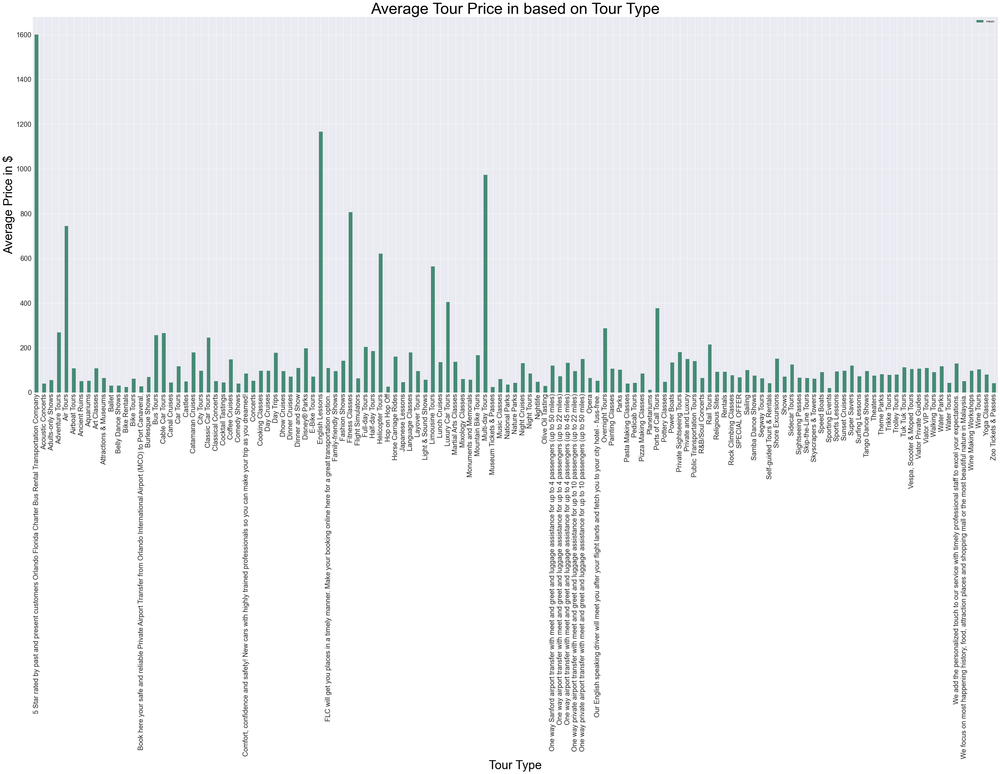

In [16]:
# What is the average price in each Type?
df.groupby(['Type']).Price.agg(['mean']).plot.bar(figsize=(50,20), color=('#458B74'))
plt.title('Average Tour Price in based on Tour Type',fontsize=45, color ='#000000')
plt.xlabel('Tour Type',fontsize=35, color ='#000000')
plt.ylabel('Average Price in $',fontsize=35, color ='#000000')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

Based on the above bar chart, the tour type affects the tour price. Most of the average tour price is less than $200

### City Map

In [17]:
# see the unique values in City column to add the Latitude and Longitude columns 
df.City.unique()

array(['Abu Dhabi', 'Al Ula', 'Antalya', 'Beijing', 'Berlin',
       'Buenos Aires', 'Cairo', 'Cape Town', 'Chicago', 'Riyadh',
       'Athens', 'Doha', 'Istanbul', 'Jeddah', 'Kuala Lumpur', 'London',
       'Madrid', 'Marrakech', 'Mumbai', 'Muscat', 'New York', 'Orlando',
       'Rio de Janeiro', 'Paris', 'Rome', 'Singapore', 'Shanghai',
       'Seoul', 'Tokyo', 'Amsterdam', 'Barcelona', 'Hong Kong',
       'Los Angeles', 'Las Vegas', 'Mexico City', 'Sydney', 'Toronto',
       'Vienna', 'Dubai'], dtype=object)

In [18]:
# add Latitude for each city
def Latitude (row):
   if row['City'] == 'Abu Dhabi' :
      return 24.4539
   if row['City'] == 'Al Ula' :
      return 26.6031
   if row['City'] == 'Antalya' :
      return 36.8969
   if row['City'] == 'Beijing':
      return 39.9042
   if row['City']  == 'Berlin':
      return 52.5200
   if row['City'] == 'Buenos Aires':
      return 34.6037
   if row['City'] == 'Cairo':
      return 30.0444
   if row['City'] == 'Cape Town':
      return 33.9249
   if row['City']  == 'Chicago':
      return 41.8781
   if row['City'] == 'Riyadh':
      return 24.7136
   if row['City'] == 'Athens':
      return 37.9838
   if row['City'] == 'Doha':
      return 25.2854
   if row['City']  == 'Istanbul':
      return 41.0082
   if row['City'] == 'Jeddah':
      return 21.4858
   if row['City'] == 'Kuala Lumpur':
      return 3.1390
   if row['City'] == 'London':
      return 51.5072
   if row['City']  == 'Madrid':
      return 40.4168
   if row['City'] == 'Marrakech':
      return 31.6295
   if row['City'] == 'Mumbai':
      return 19.0760
   if row['City'] == 'Muscat':
      return 23.5880
   if row['City']  == 'New York':
      return 40.7128
   if row['City'] == 'Orlando':
      return 28.5384
   if row['City'] == 'Rio de Janeiro':
      return 22.9068
   if row['City'] == 'Paris':
      return 48.8566
   if row['City'] == 'Rome':
      return 41.9028
   if row['City'] == 'Singapore':
      return 1.3521
   if row['City'] == 'Shanghai':
      return 31.2304
   if row['City'] == 'Seoul':
      return 37.5665
   if row['City'] == 'Tokyo':
      return 35.6762
   if row['City'] == 'Amsterdam':
      return 52.3676
   if row['City'] == 'Barcelona':
      return 41.3874
   if row['City'] == 'Hong Kong':
      return 22.3193
   if row['City'] == 'Los Angeles':
      return 34.0522
   if row['City'] == 'Las Vegas':
      return 36.1699
   if row['City'] == 'Mexico City':
      return 19.4326
   if row['City'] == 'Sydney':
      return 33.8688
   if row['City'] == 'Toronto':
      return 43.6532
   if row['City'] == 'Vienna':
      return 48.2082
   if row['City'] == 'Dubai':
      return 55.2708
   return 'Other'

In [19]:
# add Longitude for each city
def Longitude (row):
   if row['City'] == 'Abu Dhabi' :
      return 54.3773
   if row['City'] == 'Al Ula' :
      return 37.9295
   if row['City'] == 'Antalya' :
      return 30.7133
   if row['City'] == 'Beijing':
      return 116.4074
   if row['City']  == 'Berlin':
      return 13.4050
   if row['City'] == 'Buenos Aires':
      return 58.3816
   if row['City'] == 'Cairo':
      return 31.2357
   if row['City'] == 'Cape Town':
      return 18.4241
   if row['City']  == 'Chicago':
      return 87.6298
   if row['City'] == 'Riyadh':
      return 46.6753
   if row['City'] == 'Athens':
      return 23.7275
   if row['City'] == 'Doha':
      return 51.5310
   if row['City']  == 'Istanbul':
      return 28.9784
   if row['City'] == 'Jeddah':
      return 39.1925
   if row['City'] == 'Kuala Lumpur':
      return 101.6869
   if row['City'] == 'London':
      return 0.1276
   if row['City']  == 'Madrid':
      return 3.7038
   if row['City'] == 'Marrakech':
      return 7.9811
   if row['City'] == 'Mumbai':
      return 72.8777
   if row['City'] == 'Muscat':
      return 58.3829
   if row['City']  == 'New York':
      return 74.0060
   if row['City'] == 'Orlando':
      return 81.3789
   if row['City'] == 'Rio de Janeiro':
      return 43.1729
   if row['City'] == 'Paris':
      return 2.3522
   if row['City'] == 'Rome':
      return 12.4964
   if row['City'] == 'Singapore':
      return 103.8198
   if row['City'] == 'Shanghai':
      return 121.4737
   if row['City'] == 'Seoul':
      return 126.9780
   if row['City'] == 'Tokyo':
      return 139.6503
   if row['City'] == 'Amsterdam':
      return 4.9041
   if row['City'] == 'Barcelona':
      return 2.1686
   if row['City'] == 'Hong Kong':
      return 114.1694
   if row['City'] == 'Los Angeles':
      return 118.2437
   if row['City'] == 'Las Vegas':
      return 115.1398
   if row['City'] == 'Mexico City':
      return 99.1332
   if row['City'] == 'Sydney':
      return 151.2093
   if row['City'] == 'Toronto':
      return 79.3832
   if row['City'] == 'Vienna':
      return 16.3738
   if row['City'] == 'Dubai':
      return 25.2048
   return 'Other'

In [20]:
# add new column for Latitude
df['Latitude'] = df.apply (lambda row: Latitude(row), axis=1)

In [21]:
# add new column for Longitude
df['Longitude'] = df.apply (lambda row: Longitude(row), axis=1)

In [22]:
# to check the new columns
df.sample()

,Tour,Type,Duration,Price,Price Per,Cancellation,Tour By,City,Country,Image,Link to agency,Latitude,Longitude
6655,Versailles Palace & Giverny's Monet House Guid...,Bus Tours,6.0,228.81,per adult,Free cancellation,By Paris City Vision,Paris,Frence,https://dynamic-media-cdn.tripadvisor.com/medi...,https://www.tripadvisor.com/Attraction_Review-...,48.8566,2.3522


In [23]:
# map dictionary 
my_map = folium.Map(
    location= [25.3800, 49.5888],
    zoom_start=2
)
my_map

# loop all the cities in the dataset
for _, city in df.iterrows():
    folium.Marker(
        location=[city['Latitude'], city['Longitude']],
        popup= city['City'],
        tooltip= city['City']
        ).add_to(my_map)

my_map

In [24]:
# saving the map
my_map.save('tourCitiesMap.html')

#### *Conclusion:*

I've investigated and analyzed a dataset of 10,889 tours around the world, scraped from TripAdvisor.com
<br>

I've dropped the null values, renamed the columns, removed the unnecessary one and reordered the place of others. While cleaning, I did explore some of the columns such as the tour type column. I found that Bus Tours is the top type of tour in thid dataset, with more than 3500 Tours.  Followwed by the walking Tours. 
<br>

Whereas in the Tour Duration column the values were in different units: days, hours and minutes. So, I convert them all inot one unit (in hour). Also, I found that most of the Tours take 4-6 hours in average. Some of the tours are really long because it extends for days. In Terms of Tour Price, the minimum tour price in this dataset is $3.35, whereas the maximum tour price is $12,570. Most of tours price per group is less than tour price per adult. All of the Tours in this dataset are flexible booking and provide free cancellation with 3558 different agencies providing tours. I have 39 citits and 28 Countries. 
<br>

Between the countries, Oman has the highest average tour price, based on the summary statistics of the price per country we can see that the minimum tour price in Oman is $30. Whereas in the other countries (except Qatar) the minimum tour price is in this range ($3.35-$11.44) 
So, regardless other features, Oman followed by Turkey then Saudi Arabia are the countries with the highest tours average price.


<br>

**To sum up,** 
- The median duration time of the tours is 4 hours long. 
- Most of the tours in this dataset are >= 4 hours long.
- The average tour price for the long tours is approximately $250. Whereas, for all the short tours is less than $100. 
- We can not determine a direct relationship between the tour duration and price. Because the price varies even though the tours have the same duration time. 
- There are other features can affect the price such as, if the price was per adult or per group, the city or the country & the tour type.
- The tours different types affect the tour price. But most of the types have an average tour price less than $200